# **<u>RAMP on predicting cyclist traffic in Paris</u>**


## <u>Exploratory Data Analysis</u>

The dataset was collected with cyclist counters installed by Paris city council in multiple locations. It contains hourly information about cyclist traffic, as well as the following features:
 - counter name
 - counter site name
 - date
 - counter installation date
 - latitude and longitude
 
Available features are quite scarce. However, **we can also use any external data that can help us to predict the target variable.** 

In this Notebook, we are concerned with performing EDA on the given dataset adding to it external data after analyzing and cleaning it.

Our exploratory data analysis approach will be divided into the following parts:
- Loading the data with Pandas
- EDA on original dataset
- Adding external data
- 

---
---

In [265]:
from pathlib import Path

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import datetime

## **<u>Loading the data with Pandas:</u>**

*In this part we first load the data, then proceed with some commands to get a general feel for the data we're working on*

In [266]:
data = pd.read_parquet(Path("../data") / "train.parquet")
data.head()

,counter_id,counter_name,site_id,site_name,bike_count,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude,log_bike_count
48321,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 02:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48324,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,1.0,2020-09-01 03:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.693147
48327,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 04:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48330,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,4.0,2020-09-01 15:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,1.609438
48333,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,9.0,2020-09-01 18:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,2.302585


-> By looking at the head of our dataset, we first get a general idea on the different available features, in addition to getting the first impression on the type of data we're working with, we also notice that we're provided with both the bike_count and the log_bike_count (which should be highly correlated), and we notice that in addition to the locations and dates we're provided with, there are also the 'id' and 'name' columns providing identification information on the counters.

In [267]:
data.nunique(axis=0)

counter_id                     56
counter_name                   56
site_id                        30
site_name                      30
bike_count                    998
date                         8974
counter_installation_date      22
coordinates                    30
counter_technical_id           30
latitude                       30
longitude                      30
log_bike_count                998
dtype: int64

-> Looking at the number of unique entries in each column, we also learn more about the dataset: almost all counters have specific names and id's but counters placed at the same location have matching technical ids (since the counter_name column also includes the direction of bike traffic in all but some locations); additionally, we can strengthen our belief that bike_count and log_bike_count are highly correlated because they have the same number of unique entries. Comparing the bike_count and date entries, we can infer that the bike_counts probably don't vary a lot (we'll check that point later on in the analysis)

In [268]:
(
    data.groupby(["site_name", "counter_name"])["bike_count"].sum()
    .sort_values(ascending=False)
    .head(10)
    .to_frame()
)

,,bike_count
site_name,counter_name,
Totem 73 boulevard de Sébastopol,Totem 73 boulevard de Sébastopol S-N,1992227.0
Totem 64 Rue de Rivoli,Totem 64 Rue de Rivoli O-E,1551730.0
Totem 73 boulevard de Sébastopol,Totem 73 boulevard de Sébastopol N-S,1497912.0
67 boulevard Voltaire SE-NO,67 boulevard Voltaire SE-NO,1130565.0
Totem 64 Rue de Rivoli,Totem 64 Rue de Rivoli E-O,1015875.0
27 quai de la Tournelle,27 quai de la Tournelle SE-NO,984914.0
Quai d'Orsay,Quai d'Orsay E-O,948357.0
Totem Cours la Reine,Totem Cours la Reine O-E,894937.0
Face au 48 quai de la marne,Face au 48 quai de la marne SO-NE,884907.0


-> The above table provides us with the 10 most frequented stations overall by taking the sum of their bike_count entries. It also gives us a great idea on the most frequented locations (in which we'll look into in more details later on) and on the amount of variations in bike counts between the most frequented and least frequented locations.

In [269]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 496827 entries, 48321 to 929187
Data columns (total 12 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   counter_id                 496827 non-null  category      
 1   counter_name               496827 non-null  category      
 2   site_id                    496827 non-null  int64         
 3   site_name                  496827 non-null  category      
 4   bike_count                 496827 non-null  float64       
 5   date                       496827 non-null  datetime64[ns]
 6   counter_installation_date  496827 non-null  datetime64[ns]
 7   coordinates                496827 non-null  category      
 8   counter_technical_id       496827 non-null  category      
 9   latitude                   496827 non-null  float64       
 10  longitude                  496827 non-null  float64       
 11  log_bike_count             496827 non-null  floa

-> General description of our dataframe's features before proceeding further:
- Our data contains a variety of data types:
    - Some categorical (Descriptive) variables such as counter_id, counter_name and site_id, site_name, and counter_technical_id, that give information about the concerned counter and its site.
    - We have two datetime objects: the date of the observation and the date of installation of the concerned counter.
    - We also have numerical data, such as the location data (including the longitude and latitude).

In [282]:
data["counter_id"].value_counts().index.tolist()[:56]

['100007049-101007049',
 '100056335-103056335',
 '100056327-104056327',
 '100056329-103056329',
 '100056329-104056329',
 '100056330-103056330',
 '100056330-104056330',
 '100056331-103056331',
 '100056331-104056331',
 '100056332-103056332',
 '100056332-104056332',
 '100056334-103056334',
 '100056334-104056334',
 '100056335-104056335',
 '100056226-104056226',
 '100056336-105056336',
 '100056336-106056336',
 '100057329-103057329',
 '100057329-104057329',
 '100057380-103057380',
 '100057445-103057445',
 '100057445-104057445',
 '100060178-101060178',
 '100060178-102060178',
 '100063175-353277233',
 '100063175-353277235',
 '100007049-102007049',
 '100056327-103056327',
 '100056226-103056226',
 '100047546-104047546',
 '100036718-103036718',
 '100036718-104036718',
 '100036719-103036719',
 '100036719-104036719',
 '100044493-SC',
 '100047542-103047542',
 '100047542-104047542',
 '100047545-103047545',
 '100056223-SC',
 '100047546-103047546',
 '100047545-104047545',
 '100047547-103047547',
 '1000

##

---
---

In [184]:
##########################################################################################################################################
# DO NOT RUN THIS KEPT IT JUST IN CASE WE WANT TO CHANGE BACK

## **<u>Adding external data:</u>**

*In this part, we merge relevant datasets into the **'data'** pandas dataframe*

### **<u>Adding weather data:</u>**

*In this part, we add relevant weather data to our dataset since bycicle circulation is directly related to how appropriate the weather when considering use your bike or not*

In [99]:
weather_v1 = pd.read_csv('weather_v1.csv')

In [100]:
weather_v1.head()

,numer_sta,date,pmer,tend,cod_tend,dd,ff,t,td,u,...,raf10,rafper,per,etat_sol,ht_neige,rr1,rr3,rr6,rr12,rr24
0,7149,2021-01-01 00:00:00,100810,80,1,270,1.8,272.75,272.15,96,...,2.5,2.5,-10,1.0,0.00,0.0,0.0,0.0,0.0,2.0
1,7149,2021-01-01 03:00:00,100920,110,3,300,1.7,271.25,270.95,98,...,2.2,2.2,-10,1.0,0.00,0.0,0.0,0.0,0.0,1.2
2,7149,2021-01-01 06:00:00,100950,30,3,290,2.6,271.95,271.65,98,...,3.2,3.2,-10,1.0,0.00,0.0,0.0,0.0,0.0,1.0
3,7149,2021-01-01 09:00:00,101100,150,2,280,1.7,272.45,272.05,97,...,2.3,2.3,-10,13.0,0.01,0.0,0.2,0.2,0.2,0.2
4,7149,2021-01-01 12:00:00,101110,30,0,50,1.0,276.95,274.15,82,...,2.5,4.4,-10,11.0,-0.01,0.0,0.0,0.2,0.2,0.2


- Firstly, when trying to merge our original data with the cleaned weather data in 'weather_v1', we encountered a problem with the date and time of the measurements in the two datasets that aren't consistent with each other: the weather data measurement is taken every 3 hours and the bike data is taken at random hours during the day, whenever the counter detects a bike passing. Therefore, merging the two datasets without considering this difference might cause information loss in our model.

    **-> As a solution, we decided tp merge the datasets based on the date column. Again, the problem being that both dates have different granularities (the bike counters have much more observations than the weather measurements), and to address this issue we will oversample the weather data so that we don't lose observations. So every bike observation that doesn't have corresponding weather data will take the weather data of the closest observation in time (in the case where no bike observation perfectly matches a weather observation's date, it will take the observation that has been made an hour earlier/ an hour later)**

In [101]:
weather_v1['date'] = pd.to_datetime(weather_v1['date'], format='%Y-%m-%d %H:%M:%S')

weather_v1 = weather_v1.sort_values(by='date', ascending=True)

In [102]:
data = data.sort_values(by='date', ascending=True)

data = pd.merge_asof(data, weather_v1, on='date', direction='nearest')

- Our original dataset now also includes the processsed weather data. In the next cell, we check that no observation has been ommited. We notice that our dataset still has 496,827 rows and that it now has 39 columns (merging the date columns) including the weather data confirming that our merge was successful

In [103]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 496827 entries, 0 to 496826
Data columns (total 39 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   counter_id                 496827 non-null  category      
 1   counter_name               496827 non-null  category      
 2   site_id                    496827 non-null  int64         
 3   site_name                  496827 non-null  category      
 4   bike_count                 496827 non-null  float64       
 5   date                       496827 non-null  datetime64[ns]
 6   counter_installation_date  496827 non-null  datetime64[ns]
 7   coordinates                496827 non-null  category      
 8   counter_technical_id       496827 non-null  category      
 9   latitude                   496827 non-null  float64       
 10  longitude                  496827 non-null  float64       
 11  log_bike_count             496827 non-null  float64 

-> General description of the features we added to our dataframe before proceeding further:
- The weather data we added contains the following data types:
    - Numerical data: All weather data that was added (temperature (in k), humidity levels, precipitation (in mm), pressure (in Pa), etc.) is in a numerical format.

### <u>Adding French Public Holidays:</u>

    flip les deux phrases

*In this part, we add whether the days of the measurements are French public holidays (1) or not (0) in a new columns 'is_holiday'. Whether a day is a holiday or not also directly affects whether people need to move on that day or not, so it must affect the bike traffic on the roads of Paris.*

In [108]:
import holidays

fr_holidays = holidays.France(years=[2020, 2021])

def is_holiday(date):
    if date in fr_holidays:
        return 1
    else:
        return 0

data['is_holiday'] = data['date'].apply(is_holiday)
data.shape

(496827, 40)

In [109]:
data.head()

,counter_id,counter_name,site_id,site_name,bike_count,date,counter_installation_date,coordinates,counter_technical_id,latitude,...,rafper,per,etat_sol,ht_neige,rr1,rr3,rr6,rr12,rr24,is_holiday
0,100007049-101007049,28 boulevard Diderot O-E,100007049,28 boulevard Diderot,1.0,2020-09-01 01:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,100056226-103056226,Face au 8 avenue de la porte de Charenton SE-NO,100056226,Face au 8 avenue de la porte de Charenton,1.0,2020-09-01 01:00:00,2019-11-01,"48.830331,2.400551",Y2H19070370,48.830331,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,100047545-104047545,Face 104 rue d'Aubervilliers S-N,100047545,Face 104 rue d'Aubervilliers,1.0,2020-09-01 01:00:00,2018-11-29,"48.890457,2.368852",Y2H18086321,48.890457,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,100060178-102060178,90 Rue De Sèvres NE-SO,100060178,90 Rue De Sèvres,21.0,2020-09-01 01:00:00,2020-07-22,"48.84638,2.31529",Y2H20052705,48.846380,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,100056327-103056327,Face au 4 avenue de la porte de Bagnolet E-O,100056327,Face au 4 avenue de la porte de Bagnolet,2.0,2020-09-01 01:00:00,2019-11-06,"48.86461,2.40969",Y2H19070372,48.864610,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


-> General description of the features we added to our dataframe before proceeding further:
- The 'is_holiday' column we added contains the following data types:
    - Binary numerical data: this column can only have two values. It would have a value of 1 if the concerned date in the row is a holiday and it would have a value of 0 in the case where the concerned date is not a holiday.

### <u>Adding pistes cyclable locations:?</u>

In [ ]:
# Link to data: https://opendata.paris.fr/explore/dataset/reseau-cyclable/information/?disjunctive.typologie_simple&disjunctive.bidirectionnel&disjunctive.statut&disjunctive.sens_velo&disjunctive.voie&disjunctive.arrdt&disjunctive.bois&disjunctive.position&disjunctive.circulation&disjunctive.piste&disjunctive.couloir_bus&disjunctive.type_continuite&disjunctive.reseau&basemap=jawg.dark&location=12,48.85943,2.3493

### <u>Adding velib locations:?</u>

In [ ]:
# Link to data: https://opendata.paris.fr/explore/dataset/velib-emplacement-des-stations/information/

### <u>Adding Public Transportation Strikes or Disruptions:?</u>

### <u>Adding Traffic and Road Closure Information:?</u>

##

In [185]:
###########################################################################################################################################

---
---

## <u>**EDA On Original Dataset:**</u>

### **<u>Data Distribution and Descriptive Statistics:</u>**

*The datasets we added in the previous part have been treated individually in seperate notebooks available in the 'Notebooks' folder of our submission, so in the following part, we'll mainly focus on discovering more about the original dataset's features*

In [193]:
data.describe()

,site_id,bike_count,latitude,longitude,log_bike_count
count,4.968270e+05,496827.000000,496827.000000,496827.000000,496827.000000
mean,1.053450e+08,60.191475,48.854343,2.345479,3.079917
std,3.210346e+07,87.590566,0.018554,0.038026,1.659899
min,1.000070e+08,0.000000,48.826360,2.265420,0.000000
25%,1.000475e+08,5.000000,48.840801,2.314440,1.791759
50%,1.000562e+08,29.000000,48.852090,2.353870,3.401197
75%,1.000563e+08,79.000000,48.864610,2.375870,4.382027
max,3.000147e+08,1302.000000,48.891720,2.409690,7.172425


-> Looking at the summary statistics, we can infer some key points on the relevant numerical features by understanding their distributions:
- Firstly, we notice that the site_id column (eventhough it is numerical) doesn't carry relevant information on the data since its jod is to provide a description of the counters providing their IDs.
- The longitude and latitude columns also being numerical are included here, but their statistical properties aren't of interest for us because they are only here to give us information on the location of the 30 counter spots
- Finally, by looking at the bike_count column's statistical properties (we can't directly conclude anything just by looking at the log_bike_count statistical propeties), the values seem rationally distributed, but comparing them to the maximum value given, we can conclude that there is a possibility of having and outlier in this maximum.

In [194]:
zeros = data[data["bike_count"] ==0]

zeros.shape

(41401, 12)

-> We can see 41,401 observations with a 0 bike count, which is a bit less than 10% of the total observations. We will try to figure out why there is such a large number of observations with 0 bikes observed, and if its a mistake that can be understood given the circumstances of the problem.

For that, we proceed by visualizing the zeros' count vs. the hour of the day:

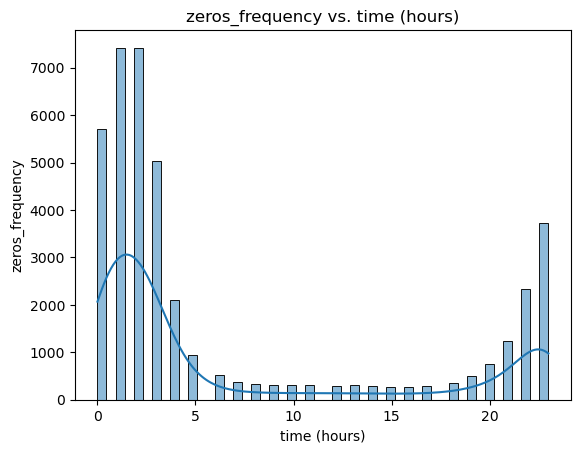

In [195]:
zeros = data[data["bike_count"] ==0].copy()

zeros.loc[:,'hour'] = pd.to_datetime(zeros.loc[:,'date']).dt.hour

ax = sns.histplot(zeros, x="hour", kde=True, bins=50)
ax.set_title('zeros_frequency vs. time (hours)')
ax.set_xlabel('time (hours)')
ax.set_ylabel('zeros_frequency')
plt.show()

-> From the zeros_frequency vs. hour we've built, we notice that the fact that we see a high density of 0 measurements in the given data is due to the timing of the measurements (barely any bikes circulate in very late or very early hours). From the frequency distribution, we can conclude that the zero values mostly occur from 10pm to 4am since most people would be sleeping at those times, its understandable to have elevated zero counts at certain instances of counters during those times.

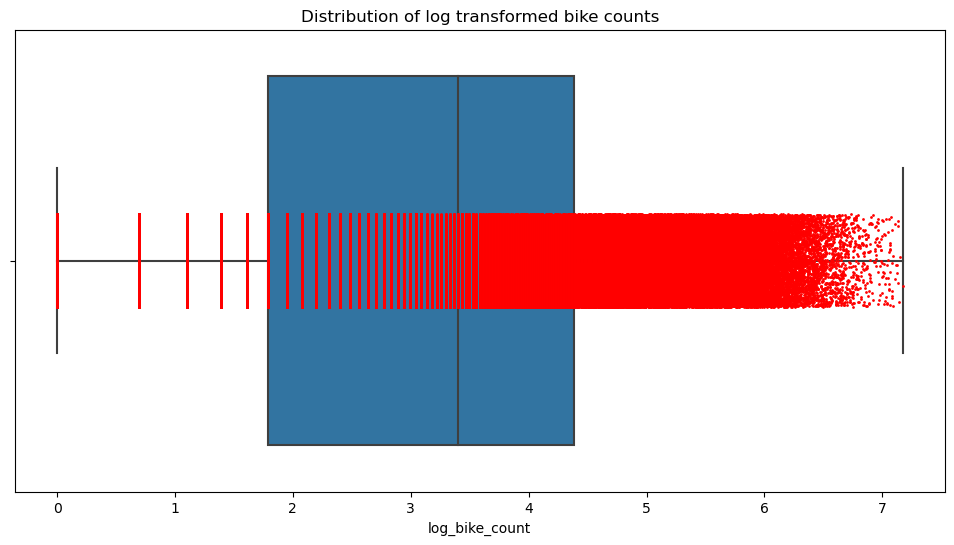

In [196]:
plt.figure(figsize=(12,6))
sns.boxplot(x = data['log_bike_count'])
sns.stripplot(x=data['log_bike_count'], color='red', jitter=True, size=2)
plt.title('Distribution of log transformed bike counts')
plt.show()

-> The above plot is to check for the possible outlier in the maximum we mentionned earlier, we chose to build the boxplot of the log_bike_count instead of the bike_count column to improve the plot's visualization. We also added the stripplot element to be able to visualize the density of the distribution of the different values. What we can conclude from this plot is that it doesn't seem to have any outlier that seems problematic, the values become less dense towards the right end of the boxplot , but they still seem logically distributed.

### **<u>Target Variable Analysis:</u>**

Following the observation we made earlier on the values of bike_count, we analyze the distribution of the bike_count values:

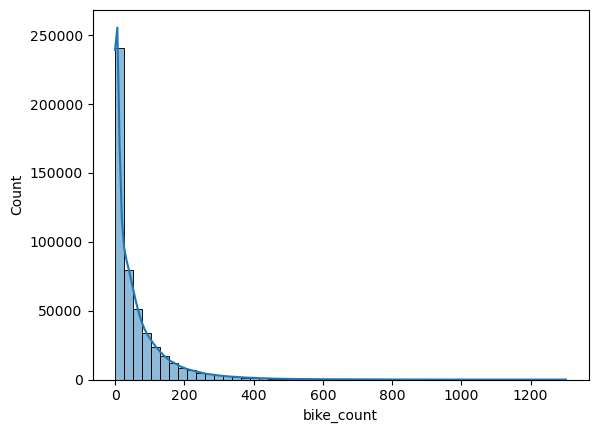

In [197]:
ax = sns.histplot(data, x="bike_count", kde=True, bins=50)

-> We notice that the distribution of the target variable (bike_count) is positively-skewed (and not normal) according to the above plot. This observation is something we'll have to take into consideration later on when choosing the model for our analysis (since some models are affected by non-normally distributions).

Again because of the high density of low bike_counts, it would be better to use the log_bike_count instead of the regular bike_count, since our final target variable is in fact the log_bike_count and also since using the transformed bike_counts would help us to better visualize the target variable's distribution to make our final conclusions:

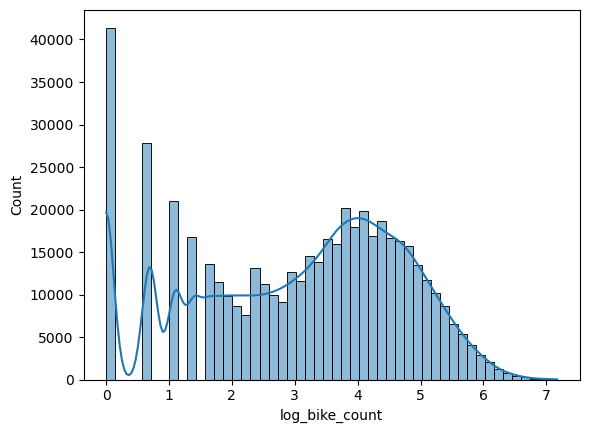

In [198]:
import seaborn as sns

ax = sns.histplot(data, x="log_bike_count", kde=True, bins=50)

-> In this case, the graph shows a more pronounced central mode, even though it isn't perfectly normally distributed. We notice that there are still a lot of highly pronounced low values, but overall, the log_bike_count's distribution is better suited than the regular bike_count's distribution in this case, even though it still has a large amount of zeros.

### **<u>Geospatial Analysis:</u>**

In the following cells, we proceed to visualizing the distribution of the counters in Paris along with an estimation of the density of the bike counts in the areas of those counters to try and explain why some counters turned out ahving higher counts than others:

In [160]:
import folium

m = folium.Map(location=data[["latitude", "longitude"]].mean(axis=0), zoom_start=13)

for _, row in (
    data[["counter_name", "latitude", "longitude"]]
    .drop_duplicates("counter_name")
    .iterrows()
):
    folium.Marker(
        row[["latitude", "longitude"]].values.tolist(), popup=row["counter_name"]
    ).add_to(m)

m

In [161]:
from folium.plugins import HeatMap

# Create a folium map centered around the mean of the coordinates
m = folium.Map(location=[data['latitude'].mean(), data['longitude'].mean()], zoom_start=12)

# Add a HeatMap layer
heat_data = [[row['latitude'], row['longitude'], row['bike_count']] for index, row in data.iterrows()]
HeatMap(heat_data).add_to(m)

# Display the map
m

-> The two most frequented counters have 2 characteristics in common. They connect two very important routes, the north-south route for Blvd De Sebastopol and the East-West route for the Rue de Rivoli counter. Also, they are both located in the centre of Paris. Those observartions might explain why they are the most frequented counters.

### **<u>Time Series Analysis:</u>**

*In this part, we analyze the target variable over time, looking for potential patterns based on trends, seasonality, etc.*

In this part, we look for interesting insights on the data by analyzing the data of the most frequented counter (S-N counter on Totem 73 Boulevard de Sebastopol), since it should be the counter that carries the most information on possible trends and patterns because of its high total bike count. We first start by simply plotting the sum of the total weekly bike_count:

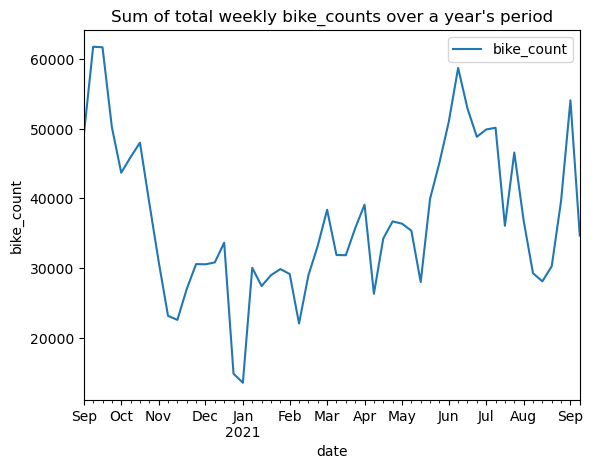

In [209]:
mask = data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N"

data[mask].groupby(pd.Grouper(freq="1w", key="date"))[["bike_count"]].sum().plot()
plt.title("Sum of total weekly bike_counts over a year's period")
plt.ylabel('bike_count')
plt.show()

- As expected, we can notice a trend that formed during the year based on the month we're in: bike riding slowly decreases from September to December, to reach a minimum in January; It then gradually goes back up to rach a peak in June then decreases again in August and finally rises again in September.

    **-> From our observations, we can conclude that the bike_count is highly affected by the time of the year when we're taking our measurements, more specifically, it's dependent on the season we're in (and therefore on the weather conditions, which is why it is a great idea to insert precise weather data in our model with the aim of imporving its accuracy - which we'll do in the next part of this notebook): we notice that the two main troughs of the graphs we mentionned earlier happen in the months of November till February (approximately) and during the month of August which concide with winter and summer periods with extreme temperatures making it either too cold or too hot to ride a bike and therefore dropping the bike counts.**


Let's then visualize a typical week's bike_count for the most frequented counter:

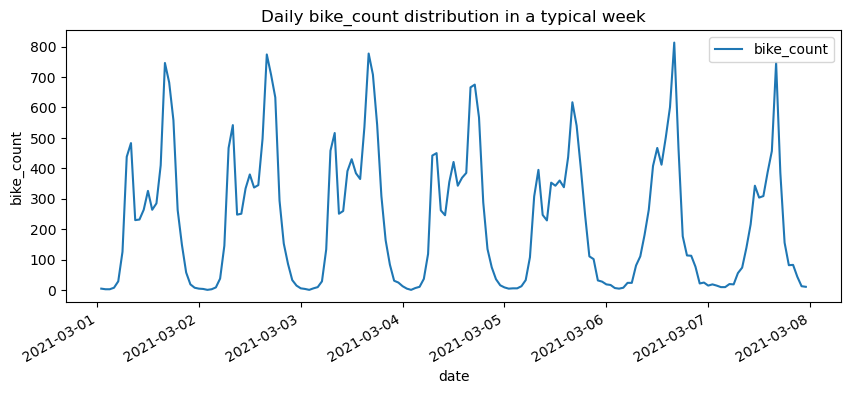

In [208]:
fig, ax = plt.subplots(figsize=(10, 4))

mask = (
    (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (data["date"] > pd.to_datetime("2021/03/01"))
    & (data["date"] < pd.to_datetime("2021/03/08"))
)

data[mask].plot(x="date", y="bike_count", ax=ax)
plt.title('Daily bike_count distribution in a typical week')
plt.ylabel('bike_count')
plt.show()

- Analyzing the above figure, we notice that the first five distributions (representing the bike_counts from Monday through Friday on a randomly chosen week) follow a similar trend that changes slightly in the last two days of the week (06 and 07, representing Saturday and Sunday). 

    **-> This change in the distribution of bike_counts between weekday and weekend is worth looking into to get an even better understanding of the data, so we plot next the single day distribution on a typical Monday and on a typical Saturday:**

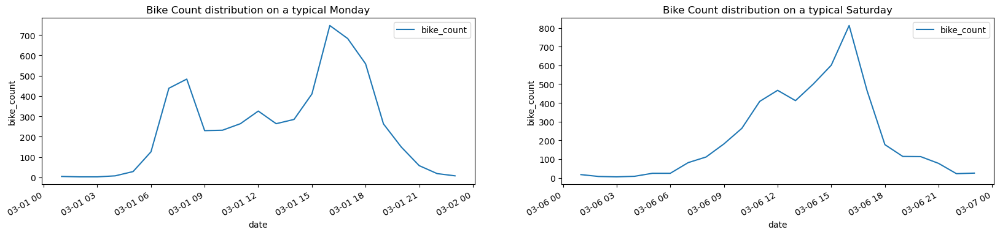

In [214]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 4))

# Data for the first plot
mask1 = (
    (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (data["date"] > pd.to_datetime("2021/03/01"))
    & (data["date"] < pd.to_datetime("2021/03/02"))
)
data[mask1].plot(x="date", y="bike_count", ax=ax1)
ax1.set_title("Bike Count distribution on a typical Monday")
ax1.set_ylabel('bike_count')

# Data for the second plot
mask2 = (
    (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (data["date"] > pd.to_datetime("2021/03/06"))
    & (data["date"] < pd.to_datetime("2021/03/07"))
)
data[mask2].plot(x="date", y="bike_count", ax=ax2)
ax2.set_title("Bike Count distribution on a typical Saturday")
ax2.set_ylabel('bike_count')

plt.show()


- Looking at the 'Bike Count distribution on a typical Monday' graph, we can see two noticeable peaks, the first one being at 8am (probably caused by a mass of people having to go to work/school) and the second one that happens between 4/5pm and that is higher than the first peak (probably due to people heading out in the afternoo and of course due to people coming back home from work). Additionally, between the two peaks, the data settles down to an almost constant count and the count can also be seen to be low early in the morning and later in the night.

- For the visualization of the weekend's bike_count, in the second graph, we can see the difference more clearly than in the previous weekly graph. For the case of a typical Saturday, we can only see a single peak now at around 4pm (around the same time as for Monday's graph), but we notice that the main difference is the absence of the first peak, probably due to the fact that people don't have to go to work early on a saturday. Moreover, just like in the last graph, we can also notice that the counts are low early in the morning and late at night.

    **-> Visualizing the difference in the distribution of bike counts between a regular workday and a weekend pushes us to see if it's the same case when comparing a workday to a holiday, and that's exactly what we've done in the following cell, selecting this time to plot the week of Monday $5^{th}$ April 2021 (including a vacation for Easter Monday):**

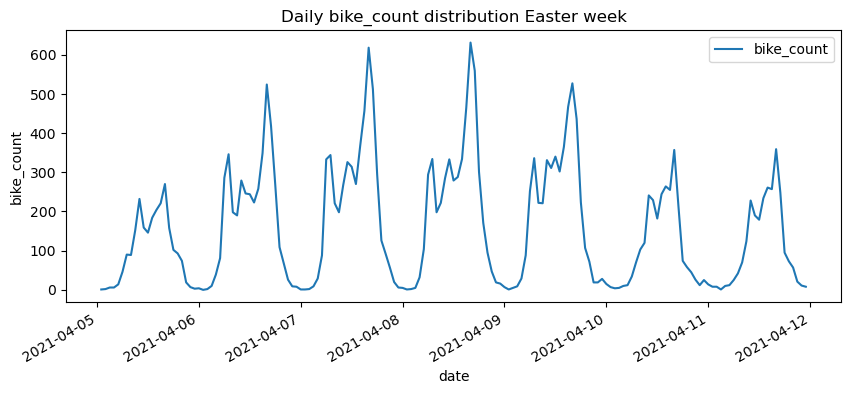

In [215]:
fig, ax = plt.subplots(figsize=(10, 4))

mask = (
    (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (data["date"] > pd.to_datetime("2021/04/05"))
    & (data["date"] < pd.to_datetime("2021/04/12"))
)

data[mask].plot(x="date", y="bike_count", ax=ax)
plt.title('Daily bike_count distribution Easter week')
plt.ylabel('bike_count')
plt.show()

- We can directly see a difference between the bike_counts on Easter Monday and the rest of the weekdays (that aren't holidays): the bike count on Monday seems to be less than the bike count on a typical workday (but it's still preserving two peaks, probably implying that not everyone didn't go to work early in the morning on that day). We can conclude that this is probably due to Monday being a holiday, implying less bike circulation on that date.

    -> This key observation, in addition to teaching us more about the dataset, gave us the intuition to consider adding whether a specific date included in our dataset's observations is a holiday or not, since it directly affects the bike circulation (this addition will be done in the next part of our notebook).

### **<u>Categorical Data Analysis:</u>**

In [217]:
categorical_columns = ['counter_id',
                       'counter_name',
                       'site_id',
                       'site_name',
                       'coordinates',
                       'latitude',
                       'longitude'
]

data[categorical_columns].nunique(axis=0) 

counter_id      56
counter_name    56
site_id         30
site_name       30
coordinates     30
latitude        30
longitude       30
dtype: int64

- Looking at the number of unique entries in each of our categrical data columns, we can see that we have 56 different counters in total (from the counter_id and counter_name rows above). We also notice that there are less unique values in site_id (and site_name) implying that there could be some sites that have multiple counters associated with them. Additionally, the latitude and longitude both have the same number of unique data points as the site_id (and site_name) column meaning that they're related (obviously since the location information is specific to each site); longitude and latitude also have the same number of unique values as the coordinates, since they both represent the location of the sites.

    **-> In the next cells of this part, we'll further look into the understanding each categorical variable and why we need them.**

Let's try to check how many counters we have per site:

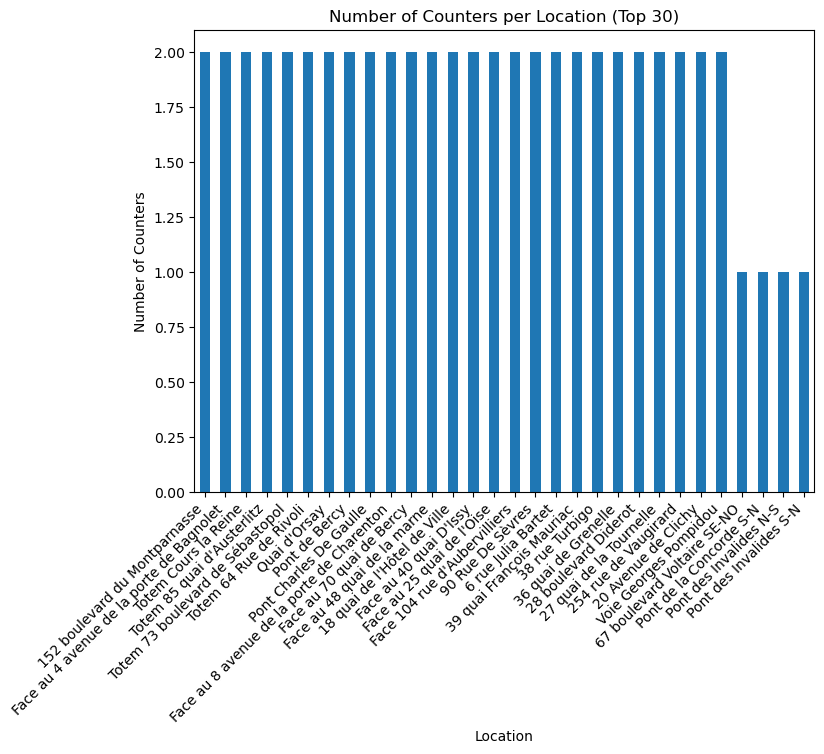

In [228]:
counters_per_location = data.groupby(["site_name"])["counter_name"].nunique().sort_values(ascending=False).head(30)

plt.figure(figsize=(8, 6)) 
counters_per_location.plot(kind='bar')

plt.title('Number of Counters per Location (Top 30)')
plt.xlabel('Location')
plt.ylabel('Number of Counters')
plt.xticks(rotation=45, ha='right')
plt.show()

-> We can conclude from this observation that since most sites have two counters (with the exception of a few sites), every specific observation is characterized by two features: the site location and the subsequent counter.

    Fix Pont des Invalides N-S and S-N

We continue by comparing the site_name and counter_name entries :

In [170]:
data["site_name"].value_counts().index.tolist()[:56] 

["Face au 40 quai D'Issy",
 "Face 104 rue d'Aubervilliers",
 'Totem 73 boulevard de Sébastopol',
 'Pont de Bercy',
 'Pont Charles De Gaulle',
 'Face au 8 avenue de la porte de Charenton',
 'Face au 70 quai de Bercy',
 'Face au 48 quai de la marne',
 "18 quai de l'Hôtel de Ville",
 'Face au 4 avenue de la porte de Bagnolet',
 "Face au 25 quai de l'Oise",
 '90 Rue De Sèvres',
 "Quai d'Orsay",
 "Totem 85 quai d'Austerlitz",
 '6 rue Julia Bartet',
 '39 quai François Mauriac',
 '38 rue Turbigo',
 '36 quai de Grenelle',
 '28 boulevard Diderot',
 '27 quai de la Tournelle',
 '20 Avenue de Clichy',
 'Totem 64 Rue de Rivoli',
 'Totem Cours la Reine',
 '152 boulevard du Montparnasse',
 'Voie Georges Pompidou',
 '254 rue de Vaugirard',
 'Pont des Invalides S-N',
 'Pont des Invalides N-S',
 'Pont de la Concorde S-N',
 '67 boulevard Voltaire SE-NO']

Next, we take a closer look at the counter names:

In [171]:
data["counter_name"].value_counts().index.tolist()[:56] 

['Face au 4 avenue de la porte de Bagnolet O-E',
 'Pont Charles De Gaulle NE-SO',
 'Face au 4 avenue de la porte de Bagnolet E-O',
 "Totem 85 quai d'Austerlitz SE-NO",
 "Face au 40 quai D'Issy NE-SO",
 "Face au 40 quai D'Issy SO-NE",
 'Face au 48 quai de la marne NE-SO',
 'Face au 48 quai de la marne SO-NE',
 'Face au 70 quai de Bercy N-S',
 'Face au 70 quai de Bercy S-N',
 'Face au 8 avenue de la porte de Charenton NO-SE',
 'Face au 8 avenue de la porte de Charenton SE-NO',
 'Pont Charles De Gaulle SO-NE',
 "Totem 85 quai d'Austerlitz NO-SE",
 'Pont de Bercy NE-SO',
 'Pont de Bercy SO-NE',
 'Pont de la Concorde S-N',
 'Pont des Invalides N-S',
 'Pont des Invalides S-N',
 "Quai d'Orsay E-O",
 "Quai d'Orsay O-E",
 'Totem 64 Rue de Rivoli E-O',
 'Totem 64 Rue de Rivoli O-E',
 'Totem 73 boulevard de Sébastopol N-S',
 "Face au 25 quai de l'Oise SO-NE",
 "Face au 25 quai de l'Oise NE-SO",
 "Face 104 rue d'Aubervilliers S-N",
 "Face 104 rue d'Aubervilliers N-S",
 "18 quai de l'Hôtel de Ville

- We can see that the name for the counter corresponds to the name of the site that is also an indicator of the direction of bike circulation (such as E-O or NE-SO). *For instance: Face au 48 quai de la marne site has 2 counters: NE-SO and SO-NE*. Another observation that can be made here is the fact that the counter_name column actually includes first the site_name, in addition to the direction of circulation (which still gives it the capacity to show our model that it has to distinguish between the two counters)

    **-> These observations push us to investigate more on the meaning of these columns for the model we'll build later on. After further reading of the dataset's documentation (from the onine website where the dataset was taken), we confirmed our assumptions that there are two counters per site to count the bike traffic going in either direction (just like in the previous example we gave, the counters capture the traffic from the North-East to the South-West and in the opposite direction from the South-West to the North-East for the 'Face au 48 Quai de la Marne' site). <u>This type of understanding of our dataset's columns allows us to potentially consider merging the two columns (site_id and counter_name) later on to reduce the dimensionality of our data by removing unapparent redundant information. Before proceeding with this, further analysis is required to define the importance of the direction of traffic that, as we noted previously, is included in the counter_name information</u>**

To continue our analysis, we first start by plotting a histogram of the total bike counts for each counter:

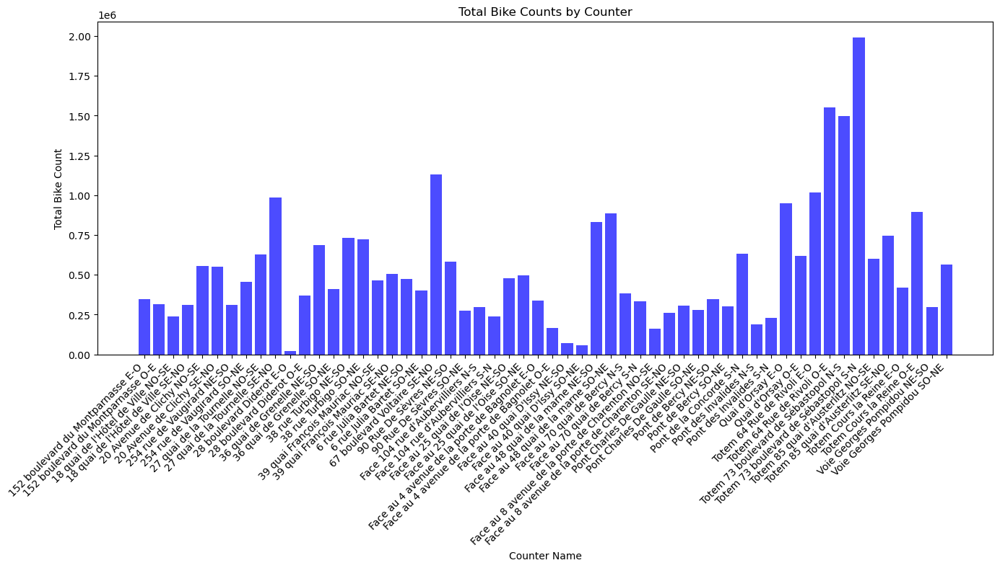

In [249]:
cols_ = ['counter_name', 'bike_count']
counter_analysis = data[cols_]
grouped_data = counter_analysis.groupby('counter_name').sum().reset_index() 

plt.figure(figsize=(16, 6))
plt.bar(grouped_data['counter_name'], grouped_data['bike_count'], color='blue', alpha=0.7)
plt.title('Total Bike Counts by Counter')
plt.xlabel('Counter Name')
plt.ylabel('Total Bike Count')
plt.xticks(rotation=45, ha='right')
plt.show()

Going further into this logic, let's check if there is substantial difference in the average bike count between the first counter and the second counter for each site. For this, we plot a histogram of the absolute differences in bike counts for matching counter pairs:

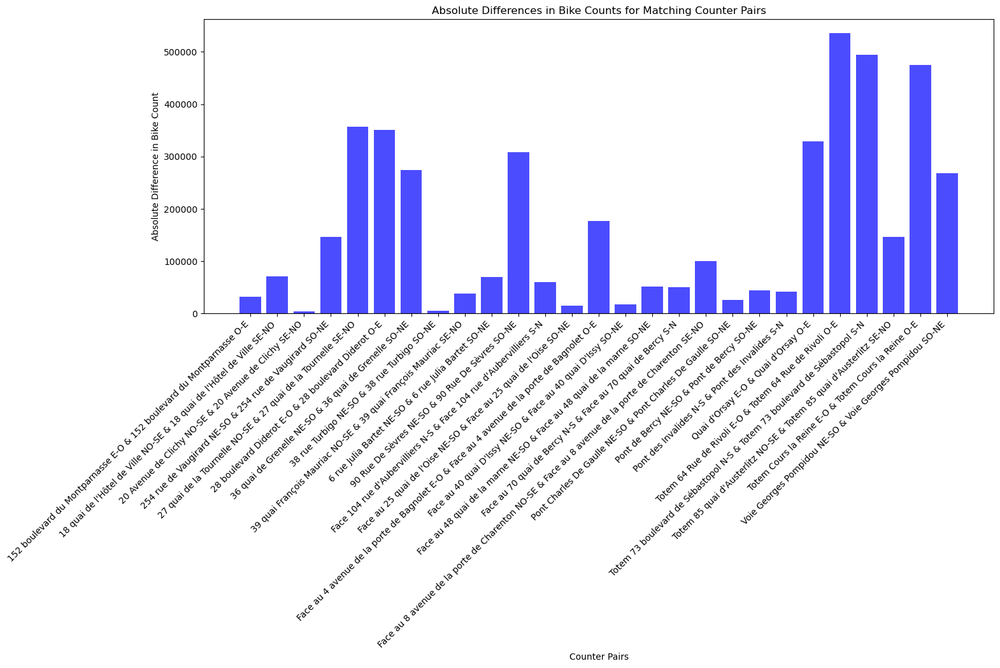

In [255]:
cols_ = ['counter_name', 'bike_count']
counter_analysis = data[cols_]
grouped_data = counter_analysis.groupby('counter_name').sum().reset_index()

pair_names = []
abs_diffs = []

i = 0
while i < len(grouped_data) - 1:
    # here, we compare the first ten characters of the counter names (to make sure they match with each
    # other before calculating their absolute difference because some sites don't have two counters)
    if grouped_data['counter_name'][i][:10] == grouped_data['counter_name'][i+1][:10]:
        abs_diff = abs(grouped_data['bike_count'][i] - grouped_data['bike_count'][i+1])
        pair_name = f"{grouped_data['counter_name'][i]} & {grouped_data['counter_name'][i+1]}"
        pair_names.append(pair_name)
        abs_diffs.append(abs_diff)
        i += 2
    else:
        i += 1  # In this case (if the names don't match), we skip to the next counter 

pairs_df = pd.DataFrame({'Pair': pair_names, 'Abs Difference': abs_diffs})

plt.figure(figsize=(16, 6))
plt.bar(pairs_df['Pair'], pairs_df['Abs Difference'], color='blue', alpha=0.7)
plt.title('Absolute Differences in Bike Counts for Matching Counter Pairs')
plt.xlabel('Counter Pairs')
plt.ylabel('Absolute Difference in Bike Count')
plt.xticks(rotation=45, ha='right')
plt.show()


- From the above graph, we can see that, for most sites, there is a really noticeable difference between the two counters' bike_counts.

    -> What we can conclude from this observation is the importance of preserving the traffic direction information in the counter_name column since it would make our predictions way more accurate when given the direction of circulation.

##

---
---

## **<u>Adding External Data:</u>**

*In this part, we merge relevant datasets into the **'data'** pandas dataframe* 

### **<u>Adding Weather Data:</u>** 

*In this part, we add relevant weather data to our dataset since bycicle circulation is directly related to how appropriate the weather when considering using your bike or not*

In [257]:
weather_v1 = pd.read_csv('weather_v1.csv')

In [258]:
weather_v1.head()

,numer_sta,date,pmer,tend,cod_tend,dd,ff,t,td,u,...,raf10,rafper,per,etat_sol,ht_neige,rr1,rr3,rr6,rr12,rr24
0,7149,2021-01-01 00:00:00,100810,80,1,270,1.8,272.75,272.15,96,...,2.5,2.5,-10,1.0,0.00,0.0,0.0,0.0,0.0,2.0
1,7149,2021-01-01 03:00:00,100920,110,3,300,1.7,271.25,270.95,98,...,2.2,2.2,-10,1.0,0.00,0.0,0.0,0.0,0.0,1.2
2,7149,2021-01-01 06:00:00,100950,30,3,290,2.6,271.95,271.65,98,...,3.2,3.2,-10,1.0,0.00,0.0,0.0,0.0,0.0,1.0
3,7149,2021-01-01 09:00:00,101100,150,2,280,1.7,272.45,272.05,97,...,2.3,2.3,-10,13.0,0.01,0.0,0.2,0.2,0.2,0.2
4,7149,2021-01-01 12:00:00,101110,30,0,50,1.0,276.95,274.15,82,...,2.5,4.4,-10,11.0,-0.01,0.0,0.0,0.2,0.2,0.2


- Firstly, when trying to merge our original data with the cleaned weather data in 'weather_v1', we encountered a problem with the date and time of the measurements in the two datasets that aren't consistent with each other: the weather data measurement is taken every 3 hours and the bike data is taken at random hours during the day, whenever the counter detects a bike passing. Therefore, merging the two datasets without considering this difference might cause information loss in our model.

    **-> As a solution, we decided tp merge the datasets based on the date column. Again, the problem being that both dates have different granularities (the bike counters have much more observations than the weather measurements), and to address this issue we will oversample the weather data so that we don't lose observations. So every bike observation that doesn't have corresponding weather data will take the weather data of the closest observation in time (in the case where no bike observation perfectly matches a weather observation's date, it will take the observation that has been made an hour earlier/ an hour later)**

In [259]:
weather_v1['date'] = pd.to_datetime(weather_v1['date'], format='%Y-%m-%d %H:%M:%S')

weather_v1 = weather_v1.sort_values(by='date', ascending=True)

In [260]:
data = data.sort_values(by='date', ascending=True)

data = pd.merge_asof(data, weather_v1, on='date', direction='nearest')

- Our original dataset now also includes the processsed weather data. In the next cell, we check that no observation has been ommited. We notice that our dataset still has 496,827 rows and that it now has 39 columns (merging the date columns) including the weather data confirming that our merge was successful

In [261]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 496827 entries, 0 to 496826
Data columns (total 39 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   counter_id                 496827 non-null  category      
 1   counter_name               496827 non-null  category      
 2   site_id                    496827 non-null  int64         
 3   site_name                  496827 non-null  category      
 4   bike_count                 496827 non-null  float64       
 5   date                       496827 non-null  datetime64[ns]
 6   counter_installation_date  496827 non-null  datetime64[ns]
 7   coordinates                496827 non-null  category      
 8   counter_technical_id       496827 non-null  category      
 9   latitude                   496827 non-null  float64       
 10  longitude                  496827 non-null  float64       
 11  log_bike_count             496827 non-null  float64 

-> General description of the features we added to our dataframe before proceeding further:
- The weather data we added contains the following data types:
    - Numerical data: All weather data that was added (temperature (in k), humidity levels, precipitation (in mm), pressure (in Pa), etc.) is in a numerical format.

### **<u>Adding French Public Holidays:</u>**

    flip les deux phrases

*In this part, we add whether the days of the measurements are French public holidays (1) or not (0) in a new columns 'is_holiday'. Whether a day is a holiday or not also directly affects whether people need to move on that day or not, so it must affect the bike traffic on the roads of Paris.*

In [262]:
import holidays

fr_holidays = holidays.France(years=[2020, 2021])

def is_holiday(date):
    if date in fr_holidays:
        return 1
    else:
        return 0

data['is_holiday'] = data['date'].apply(is_holiday)
data.shape

(496827, 40)

In [263]:
data.head()

,counter_id,counter_name,site_id,site_name,bike_count,date,counter_installation_date,coordinates,counter_technical_id,latitude,...,rafper,per,etat_sol,ht_neige,rr1,rr3,rr6,rr12,rr24,is_holiday
0,100007049-101007049,28 boulevard Diderot O-E,100007049,28 boulevard Diderot,1.0,2020-09-01 01:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,100056226-103056226,Face au 8 avenue de la porte de Charenton SE-NO,100056226,Face au 8 avenue de la porte de Charenton,1.0,2020-09-01 01:00:00,2019-11-01,"48.830331,2.400551",Y2H19070370,48.830331,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,100047545-104047545,Face 104 rue d'Aubervilliers S-N,100047545,Face 104 rue d'Aubervilliers,1.0,2020-09-01 01:00:00,2018-11-29,"48.890457,2.368852",Y2H18086321,48.890457,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,100060178-102060178,90 Rue De Sèvres NE-SO,100060178,90 Rue De Sèvres,21.0,2020-09-01 01:00:00,2020-07-22,"48.84638,2.31529",Y2H20052705,48.846380,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,100056327-103056327,Face au 4 avenue de la porte de Bagnolet E-O,100056327,Face au 4 avenue de la porte de Bagnolet,2.0,2020-09-01 01:00:00,2019-11-06,"48.86461,2.40969",Y2H19070372,48.864610,...,3.1,-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


-> General description of the features we added to our dataframe before proceeding further:
- The 'is_holiday' column we added contains the following data types:
    - Binary numerical data: this column can only have two values. It would have a value of 1 if the concerned date in the row is a holiday and it would have a value of 0 in the case where the concerned date is not a holiday.

### **<u>Adding Pistes Cyclable Locations:</u>**

In [180]:
# Link to data: https://opendata.paris.fr/explore/dataset/reseau-cyclable/information/?disjunctive.typologie_simple&disjunctive.bidirectionnel&disjunctive.statut&disjunctive.sens_velo&disjunctive.voie&disjunctive.arrdt&disjunctive.bois&disjunctive.position&disjunctive.circulation&disjunctive.piste&disjunctive.couloir_bus&disjunctive.type_continuite&disjunctive.reseau&basemap=jawg.dark&location=12,48.85943,2.3493

### **<u>Adding Velib Locations:</u>**

In [181]:
# Link to data: https://opendata.paris.fr/explore/dataset/velib-emplacement-des-stations/information/

### <u>Adding Public Transportation Strikes or Disruptions:?</u>

### <u>Adding Traffic and Road Closure Information:?</u>

##

---
---

## **<u>EDA on Final Data:</u>**

### **<u>Bike traffic depending on weather:</u>**

In [136]:
# Show relevance of temperature and humidity on bike traffic

##

---
---

## **<u>Data preparation and cleaning:</u>**

check for NaN values?

In [49]:
original_columns = ['counter_id', 
                    'counter_name', 
                    'site_id', 
                    'site_name', 
                    'bike_count', 
                    'date', 
                    'counter_installation_date', 
                    'coordinates', 
                    'counter_technical_id', 
                    'latitude', 
                    'longitude', 
                    'log_bike_count'
]

nan_counts = data[original_columns].isna().sum()
print(nan_counts)

counter_id                   0
counter_name                 0
site_id                      0
site_name                    0
bike_count                   0
date                         0
counter_installation_date    0
coordinates                  0
counter_technical_id         0
latitude                     0
longitude                    0
log_bike_count               0
dtype: int64


Let's first select some values to keep in the dataset. We can try adding the other features later. 

Let's first remove descriptive variables such as counter_name and site_name since we have associated ID's that can identify them. We also remove bike_count since we already have the log_bike_count and also the counter_technical_ID since its identification linked to the counter, which we already have. We also remove numer_sta since its the same station that did the observations so its doesnt bring any new information.

In [137]:
data = data[['counter_id',
      #'counter_name',
      'site_id', 
      #'site_name', 'bike_count',
      'date', 'counter_installation_date', 
      #'counter_technical_id',
      'latitude', 'longitude', 'log_bike_count', 
      #'numer_sta',
      'pmer', 'tend', 'cod_tend',
       'dd', 'ff', 't', 'td', 'u', 'vv', 'ww', 'w1', 'w2', 'n', 'nbas', 'pres',
       'tend24', 'raf10', 'rafper', 'per', 'etat_sol', 'ht_neige', 'rr1',
       'rr3', 'rr6', 'rr12', 'rr24']].copy()

In [138]:
data.dtypes

counter_id                         category
site_id                               int64
date                         datetime64[ns]
counter_installation_date    datetime64[ns]
latitude                            float64
longitude                           float64
log_bike_count                      float64
pmer                                  int64
tend                                  int64
cod_tend                              int64
dd                                    int64
ff                                  float64
t                                   float64
td                                  float64
u                                     int64
vv                                    int64
ww                                    int64
w1                                  float64
w2                                  float64
n                                   float64
nbas                                float64
pres                                  int64
tend24                          

Let's rename some of the columns for more clarification

In [139]:
data = data.rename(columns={'dd': 'wind_dir',
                     'ff': 'wind_vel',
                     't': 'temp',
                     'td': 'dew',
                     'u': 'hum',
                     'vv': 'visib',
                     'ww': 'weather',
                     'n': 'cloud_perc',
                     })

data.columns

Index(['counter_id', 'site_id', 'date', 'counter_installation_date',
       'latitude', 'longitude', 'log_bike_count', 'pmer', 'tend', 'cod_tend',
       'wind_dir', 'wind_vel', 'temp', 'dew', 'hum', 'visib', 'weather', 'w1',
       'w2', 'cloud_perc', 'nbas', 'pres', 'tend24', 'raf10', 'rafper', 'per',
       'etat_sol', 'ht_neige', 'rr1', 'rr3', 'rr6', 'rr12', 'rr24'],
      dtype='object')

Let's check now for duplicated data

In [140]:
data.loc[data.duplicated()]

,counter_id,site_id,date,counter_installation_date,latitude,longitude,log_bike_count,pmer,tend,cod_tend,...,raf10,rafper,per,etat_sol,ht_neige,rr1,rr3,rr6,rr12,rr24


There is no duplicated data

##

---
---

## **<u>Data Profiling:</u>**

In [ ]:
import ydata_profiling

data.profile_report()

per has all constant values,
- we have high correlation between counter_id and other such as latitude and longitude, 
- also pmer and pres, 
- tend and cod_tend, 
- temp and dew point
- w1 w2 cloud_perc and n_bas also highly correlated,
- also wind_vel raf10 and rafper, 
- also rr1 rr3 rr6 rr12 rr24 etat_sol, ht_neige has high zeros, etat_sol too, 

1) High correlation between counter_id and other identifiers such as latitude and longitude might mean that we already have enough information that can distiguinsh counters

2) pmer and pres are very correlated so it can be that they represent very close variiables

3) tend and cod_tend are very negatively correlated

4) w1 w2 cloud_perc and n_bas also

5) wind_vel and raf10 and rafper sincer they deal eith wind velocity and gust



Start with the per column

In [ ]:
data['per'].value_counts(normalize=True) * 100

Let's start with per, we can see all values without exception are constant, at -10. So we can simply remove it.

In [36]:
data = data.drop(columns= 'per').copy()

data.columns

Index(['counter_id', 'site_id', 'date', 'counter_installation_date',
       'latitude', 'longitude', 'log_bike_count', 'pmer', 'tend', 'cod_tend',
       'wind_dir', 'wind_vel', 'temp', 'dew', 'hum', 'visib', 'weather', 'w1',
       'w2', 'cloud_perc', 'nbas', 'pres', 'tend24', 'raf10', 'rafper',
       'etat_sol', 'ht_neige', 'rr1', 'rr3', 'rr6', 'rr12', 'rr24'],
      dtype='object')

Next let's look into the counter_id and the other correlated variables

In [37]:
mask = ['counter_id', 'site_id', 'latitude', 'longitude']

test = data[mask]

test

,counter_id,site_id,latitude,longitude
0,100007049-101007049,100007049,48.846028,2.375429
1,100056226-103056226,100056226,48.830331,2.400551
2,100047545-104047545,100047545,48.890457,2.368852
3,100060178-102060178,100060178,48.846380,2.315290
4,100056327-103056327,100056327,48.864610,2.409690
...,...,...,...,...
496822,100057380-103057380,100057380,48.864620,2.314440
496823,100047547-103047547,100047547,48.826360,2.303030
496824,100047548-103047548,100047548,48.891410,2.384820
496825,100042374-110042374,100042374,48.848400,2.275860


We can see that every counter ID has the site ID before it, so that we know that its linked to that site. However, we should also determine if latitude and longitude belong to the counter or to the site, and if its the same for both.

Let's first check that for each site we have unique latitude and longtitudes. Of course we expect it to be unique since a site cannot move and its latitude and longitude are fixed, but its to check for error.

In [38]:
latitude_check = test.groupby('site_id')['latitude'].nunique() == 1

# Check longitude
longitude_check = test.groupby('site_id')['longitude'].nunique() == 1

# Display the results
print("Latitude Check:")
print(latitude_check)

print("\nLongitude Check:")
print(longitude_check)

Latitude Check:
site_id
100007049    True
100036718    True
100036719    True
100042374    True
100044493    True
100047542    True
100047545    True
100047546    True
100047547    True
100047548    True
100049407    True
100050876    True
100056046    True
100056047    True
100056223    True
100056226    True
100056327    True
100056329    True
100056330    True
100056331    True
100056332    True
100056334    True
100056335    True
100056336    True
100057329    True
100057380    True
100057445    True
100060178    True
100063175    True
300014702    True
Name: latitude, dtype: bool

Longitude Check:
site_id
100007049    True
100036718    True
100036719    True
100042374    True
100044493    True
100047542    True
100047545    True
100047546    True
100047547    True
100047548    True
100049407    True
100050876    True
100056046    True
100056047    True
100056223    True
100056226    True
100056327    True
100056329    True
100056330    True
100056331    True
100056332    True
1000

In [39]:
bike_dist_per_counter = test.groupby(["site_id", "counter_id"])["latitude"].max().to_frame().dropna().sort_values(
    by=["site_id"], ascending=True)

bike_dist_per_counter

latitude
site_id   counter_id                    
100007049 100007049-101007049  48.846028
          100007049-102007049  48.846028
100036718 100036718-103036718  48.834360
          100036718-104036718  48.834360
100036719 100036719-103036719  48.853720
          100036719-104036719  48.853720
100042374 100042374-109042374  48.848400
          100042374-110042374  48.848400
100044493 100044493-SC         48.861490
100047542 100047542-103047542  48.891720
          100047542-104047542  48.891720
100047545 100047545-104047545  48.890457
          100047545-103047545  48.890457
100047546 100047546-103047546  48.829523
          100047546-104047546  48.829523
100047547 100047547-103047547  48.826360
          100047547-104047547  48.826360
100047548 100047548-103047548  48.891410
          100047548-104047548  48.891410
100049407 100049407-353255859  48.840801
          100049407-353255860  48.840801
100050876 100050876-103050876  48.857350
          100050876-104050876  48.857350
100056046 100056046-SC         48.862820
100056047 100056047-SC         48.863780
100056223 100056223-SC         48.862840
100056226 100056226-104056226  48.830331
          100056226-103056226  48.830331
100056327 100056327-103056327  48.864610
          100056327-104056327  48.864610
100056329 100056329-103056329  48.842230
          100056329-104056329  48.842230
100056330 100056330-103056330  48.852090
          100056330-104056330  48.852090
100056331 100056331-103056331  48.834210
          100056331-104056331  48.834210
100056332 100056332-103056332  48.838480
          100056332-104056332  48.838480
100056334 100056334-103056334  48.865020
          100056334-104056334  48.865020
100056335 100056335-104056335  48.862880
          100056335-103056335  48.862880
100056336 100056336-105056336  48.850130
          100056336-106056336  48.850130
100057329 100057329-103057329  48.842010
          100057329-104057329  48.842010
100057380 100057380-103057380  48.864620
          100057380-104057380  48.864620
100057445 100057445-103057445  48.863770
          100057445-104057445  48.863770
100060178 100060178-101060178  48.846380
          100060178-102060178  48.846380
100063175 100063175-353277233  48.885290
          100063175-353277235  48.885290
300014702 300014702-353245971  48.839770
          300014702-353245972  48.839770

We can see here that both counters in a site have the same longitude and latitude, which means that the coordinates are for the site! So, the coordinates and the site ID represent the same information, which is identification about the site. So, to be able to identify a counter, we might make use only of site ID or of coordinates. 

# Model training

In [ ]:
merged_data.to_csv('merged_v1.csv', index=False)